## WIDS Texas Datathon 2021: Prediction of Electricity Load 

By [Ishita Chakraborty](https://www.linkedin.com/in/ishitachakrabortyphd/)


This notebook explores the prediction of electrical load for 7 days into the future using historical data of Texas and predicted weather for the 7 days. A multi-layer LSTM model is trained for forecasting hourly electricity usage.

This work is submitted as an entry to the WiDS Texas Datathon 2021. The input data to the model is stored in a git repo and updated every day. In the current state of the notebook, the forecasting is for June 13 to June 20,2021.


####Import Data and libraries
Some exploration of the data is done through plotting.


In [ ]:
!git clone https://github.com/WiDSTexas2021/datathon-code.git
!git clone https://github.com/ishita1983/LSTM_Electricity_Load_Forecast

In [ ]:
#@title All the libraries required for this notebook are imported
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.pylab import rcParams
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import tensorflow as tf
import pytz
import matplotlib.image as mpimg
import datetime as dt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, RepeatVector, TimeDistributed
from sklearn.preprocessing import StandardScaler, MinMaxScaler
%matplotlib inline

sns.set(style='whitegrid', palette='muted')
rcParams['figure.figsize'] = 14, 8
np.random.seed(1)
tf.random.set_seed(1)

print('Tensorflow version:', tf.__version__)

Tensorflow version: 2.5.0


### All the helper functions needed for forecastingn model is stored below. The descriptions of the helper functions are:



*   `show_image`: shows an image in the notebook
*   `create_dataset`: create segmentation of the input and the output data according to time steps and time lags
*    `create_data_frame_for_ml`: from region name, hourly load, weather forecast and history generates the dataframe to be used in training and that includes the weather and the hourly loads
*    `filter_training_data`: filters a data frame between a start day and an end day
*     `transform_data`: scales the wether and the hourly usage data and also returns the scalers
*     `train_model`: defines the LSTM model and trains it on the trainig data set
*     `create_datestamp_ds`: creates the date and time stamps for the forecast 
*     `forecast`: uses the trained model to predict data in to the future


In [ ]:
cityname_dict = {'South':'Corpus Christi',
                 'North':'Wichita Falls',
                 'Coast':'Houston',
                 'Far West':'Midland',
                 'South Central':'Austin',
                 'East':'Tyler',
                 'West':'Abilene',
                 'North Central':'Dallas'}


def show_image(im):
    ''' Shows the image im in the notebook'''
    plt.imshow(mpimg.imread(im))
    plt.grid(False)  
    plt.xticks([])
    plt.yticks([])
    plt.show()

def create_dataset(X2, y, time_steps_in, time_steps_out,lag_steps):
    '''create segmentation of the input and the output data according to time steps and time lags'''
    Xs, ys = [], []
    for i in range(len(y) - time_steps_out-time_steps_in+1):
        if i ==0:
             startindex = i
        else:
             startindex = startindex +   lag_steps
        if startindex <  (len(y) - time_steps_out- time_steps_in  ):
             
             v2 = X2[(startindex + time_steps_in):(startindex+ time_steps_in + time_steps_out)] # weather in furture
             v = v2
             v = np.reshape(v,(time_steps_in,1))
             Xs.append(v)        
             ys.append(y[(startindex + time_steps_in):(startindex+ time_steps_in + time_steps_out)])
        else:    
             break
    return np.array(Xs),np.array(ys)    

def create_data_frame_for_ml(region, df_weather_history,df_weather_forecast,df_hr_load):    
      '''from region name, hourly load, weather forecast and history: geneartes the dataframe to be used in training and the weather prediction in that region'''
      cityname = cityname_dict[region]
      df_weather_region_history = df_weather_history[df_weather_history['city']==cityname]
      df_weather_region_forecast = df_weather_forecast[df_weather_forecast['city']==cityname]
      df_hr_load['Hour_Ending']=df_hr_load['Hour_Ending'].apply(lambda x:x.replace(tzinfo=None)  )
      df_to_ml=df_hr_load.merge(df_weather_region_history,  how = 'left', left_on='Hour_Ending', right_on='timestamp')
      df_to_ml['tempF'] = df_to_ml['tempF'].interpolate(method='linear')
      df = df_to_ml[['Hour_Ending','tempF',region]]
      print('Complete...created and merged data sets for weather region ' + region)
      return df, df_weather_region_forecast

def plot_timeseries(dates,weather,hourly_usage,region):
      fig = make_subplots(specs=[[{"secondary_y": True}]])
      fig.add_trace(go.Scatter(x=dates,y=weather,name = 'Temperature (degF) '+cityname_dict[region]))
      fig.add_trace(go.Scatter(x=dates,y=hourly_usage,name='Hourly Electricity Use (KWH) for '+region),secondary_y=True)
      fig.update_layout(showlegend=True)
      fig.update_xaxes(title_text="Date")
      fig.update_yaxes(title_text="Temperature (degF)", secondary_y=False)
      fig.update_yaxes(title_text="Hourly Electricity Use (KWH)", secondary_y=True)
      fig.show()      

def str_to_dt(timestr,hr,min):
      '''converts date time string to datetime'''
      return dt.datetime.strptime(timestr,'%m-%d-%Y').replace(hour=hr,minute=min)

def filter_training_data(df,day_training_starts, day_training_stops):
      '''filters the data based on training start and stop dates'''
      index_training = (df['Hour_Ending']>day_training_starts) & (df['Hour_Ending']<=day_training_stops)
      train_df = df[index_training]
      num_row_tar = ((day_training_stops-day_training_starts).days)*24
      num_row_ac = train_df.shape[0]
      if num_row_tar==num_row_ac:
        print('The number of data entries match hourly requirement')
      else:
        print('The number of data entries mismatch hourly requirement by '+ str(num_row_ac-num_row_tar))
      print('Complete... filtered data according to the start and end days')    
      return train_df  

def transform_data(train_df, region):
      
      train_data= train_df[[region,'tempF']].values

      scaler1 = MinMaxScaler()
      scaler2 = MinMaxScaler()
      X1 = train_data[:,0].reshape(train_df.shape[0],1)
      X2 = train_data[:,1].reshape(train_df.shape[0],1)

      scaler_use_el = scaler1.fit(X1)
      scaler_weather = scaler2.fit(X2)
      train_X1 = scaler_use_el.transform(X1)
      train_X2 = scaler_weather.transform(X2)

      print(' Train data shape (before transformtion) for load and temperature: '+str (train_X1.shape)+str (train_X2.shape))
      print('Complete... transformation and scaling of traing data')
      return (train_X1,train_X2, scaler_use_el,scaler_weather)

          
def train_model(X_train,Y_train):
     '''defines the LSTM model and trains it on the training data set'''
     num_features = X_train.shape[2]
     time_steps_in = X_train.shape[1]
     time_steps_out = Y_train.shape[1]
     model = Sequential([
       LSTM(200, activation = 'relu', input_shape=(time_steps_in, num_features),return_sequences=True),
       LSTM(200, return_sequences=True),
       LSTM(100, return_sequences=True),
       LSTM(100, activation = 'relu'),
       Dense(time_steps_out)])
     model.compile(loss='mse', optimizer='adam')
     es = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5, mode='min',restore_best_weights=True,verbose = 1)
     print('Training LSTM Model...')
     history=model.fit(X_train,Y_train, epochs = 50,callbacks = es, validation_split = 0.1, batch_size = 128,verbose = 0 )
     print('Complete... Training the Model')
     print('Plotting loss over epochs...')
     plt.plot(history.history['loss'], label='Training Loss')
     plt.plot(history.history['val_loss'], label='Validation Loss')
     plt.grid(True)
     plt.legend()
     plt.xlabel('Epochs')
     plt.ylabel('Loss')
     plt.show()
     return model

def create_datestamp_df(prediction_start_date, prediction_end_date):
    df_ts_test = pd.DataFrame({'Hours': pd.date_range(prediction_start_date, prediction_end_date, freq='1H')} )
    return df_ts_test

def forecast(model,df_ts_test,df_weather_region_forecast,region,scaler_use_el,scaler_weather):
  df_test=df_ts_test.merge(df_weather_region_forecast,  how = 'left', left_on='Hours', right_on='timestamp')
  df_test['tempF'] = df_test['tempF'].interpolate(method='linear')
  df_test = df_test.drop([0])
  df_test = df_test[['Hours','tempF']]
  X_test =  df_test['tempF'].values
  X_test = scaler_weather.transform(X_test.reshape(X_test.shape[0],1))
  Xtest = X_test.reshape(1,X_test.shape[0],1)
  y_pred = model(Xtest)
  predicted_use = scaler_use_el.inverse_transform(y_pred)[0]
  print('Complete ... making predictions')
  return df_test, predicted_use      

### Explore data

Explore the available data with plots and charts.

The map below shows the different weather zones in Texas. We will use this to track the cities related to the weather zones and pull out the zonal weather history and weather prediction.



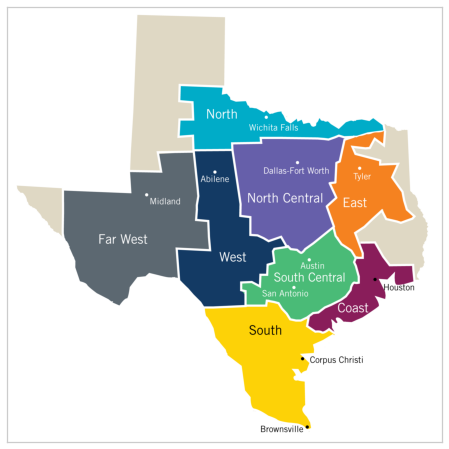

In [ ]:
show_image('datathon-code/data/ercotWeatherZoneMap.png')

In the hourly usage data, electricity usage is recorded for every hour for eight weather zones of Texas. All timeseries data is plotted to take a closer look at the variation. The plots can be zoomed in to reveal a more granular detail. As the plots are examined (zoom) in at a monthly, weekly, and daily level and few details come out:

*   There is hourly variation in the usage with more use in the day time
*   There is some variation in summer and winter months 
*   For most weather zones except for Far West, the usage data is stationary for the past 5 years
*    However in the Far West region, usage has been up significantly in the past 2 years, most likely due to the population growth in the Midland area around the Permian Basin
*    There is some variation during weekends and weekdays too



In [ ]:
df_hr_load= pd.read_csv('datathon-code/data/ercot_hourly_load.csv',parse_dates=['Hour_Ending'])

In [ ]:
for i in range(1,len(df_hr_load.columns)):
 fig = go.Figure()
 fig.add_trace(go.Scatter(x=df_hr_load[df_hr_load.columns[0]], y=df_hr_load[df_hr_load.columns[i]],
                    mode='lines',name=df_hr_load.columns[i]))
 fig.update_layout(showlegend=True)
 fig.show()

FInd out if there are any missing values in the hourly load data. Only one entry was found. The missing values are replaced with preceding values.

In [ ]:
print('This is the summary of how many NaN entries are there:')
print(df_hr_load.isnull().sum())
print('This is where the Nan Values are:')
print(df_hr_load[df_hr_load['East'].isnull()])
df_hr_load=df_hr_load.fillna(method='ffill')
print('This is the summary of how many NaN entries are there after filling:')
print(df_hr_load.isnull().sum())

This is the summary of how many NaN entries are there:
Hour_Ending      0
Coast            1
East             1
Far West         1
North            1
North Central    1
South            1
South Central    1
West             1
dtype: int64
This is where the Nan Values are:
                      Hour_Ending  Coast  East  ...  South  South Central  West
103871  2016-11-07 00:00:00-06:00    NaN   NaN  ...    NaN            NaN   NaN

[1 rows x 9 columns]
This is the summary of how many NaN entries are there after filling:
Hour_Ending      0
Coast            0
East             0
Far West         0
North            0
North Central    0
South            0
South Central    0
West             0
dtype: int64


Next we will look at other data. Although covid data is available, it does not look like there is any thing special in the 2020 hourly usage data due to covid. So the covid data is not used in the model. The weather history and weather prediction will be used in building the model.




In [ ]:
df_weather_forecast= pd.read_csv('datathon-code/data/weather_forecast.csv')
df_weather_history= pd.read_csv('datathon-code/data/weather_history.csv')


Make the values of the datetime column into datetime data format. For that a bit of pre-processing is necessary.

In [ ]:
time_dict = {0:'00:00', 300:'3:00', 600:'6:00', 900:'9:00', 1200:'12:00', 1500:'15:00', 1800:'18:00', 2100:'21:00'}
df_weather_forecast= df_weather_forecast.replace({'time':time_dict})
df_weather_history= df_weather_history.replace({'time':time_dict})
df_weather_forecast['timestamp'] = df_weather_forecast['date'] + ' ' + df_weather_forecast['time'] 
df_weather_history['timestamp'] = df_weather_history['date'] + ' ' + df_weather_history['time']
df_weather_history['timestamp']= pd.to_datetime(df_weather_history['timestamp'])
df_weather_forecast['timestamp']= pd.to_datetime(df_weather_forecast['timestamp'])

Check if there are any Nan Values in the weather data. Looks like not!

In [ ]:
print('Number of Nan entries in weather forecast: '+str(df_weather_forecast.isnull().values.sum()))
print('Number of Nan entries in weather history: '+str(df_weather_history.isnull().values.sum()))


Number of Nan entries in weather forecast: 0
Number of Nan entries in weather history: 0


### Description: Preprocessing and Feature Engineering

Prior to building the predictive model, the data needs to be prepared. The data sets to be used for training are the hourly electricity usage data and the weather history data (3-hourly). In order to have the correct sequence for training, these data sets need to be merged. The function `create_data_for_ml` creates the merged data set by:  


1.   matching the time stamp between the two data frames (electricity use and weather)
2.   interpolating (linear) in the missing hourly values in the 3 hourly weather data to match with hourly electricity usage data

After the dataframes are merged, the weather and the electricity usage data are plotted together.

* For training, the data will need to be scaled and the scaling parameters 
on the training data is saved for use during predictions.

* Another important thing is to set the **start of training date at the same day of the week we would like the predictions to start (which is a Sunday in this case)**. The shift to the data is 7 days for each training example, so that the training process captures the correct sequence of days of the week. This can be easily done when we have a stationary training set for a long period, which is true for all zones except Far West.



### Description: Model Training (LSTM)

* The first step in model building is creating the proper training data set. 

* We will start here with a multi time step LSTM model that predicts the output only from the weather (temerature) at that time stamp. The model will be trained on the past usage as output with historical weather as the input. In the test set (prediction) the weather forecast will be used as the input for the electricity usage forecast. The two schematics below show the scheme of training data selections. 

* The second figure shows the schematic of the RNN (LSTM) model used here for the sequence data.

* The model will be trained with the stationary time series data (last 6 years data, 2 years for far west)

* 10% of the training data will kept as validation set. Early stopping will be used to reduce overtraining.

* The test data here is the 7 days forecast. Checks have been done by keeping aside last few days of known data as test set. In the final run all the data is used to train the model.

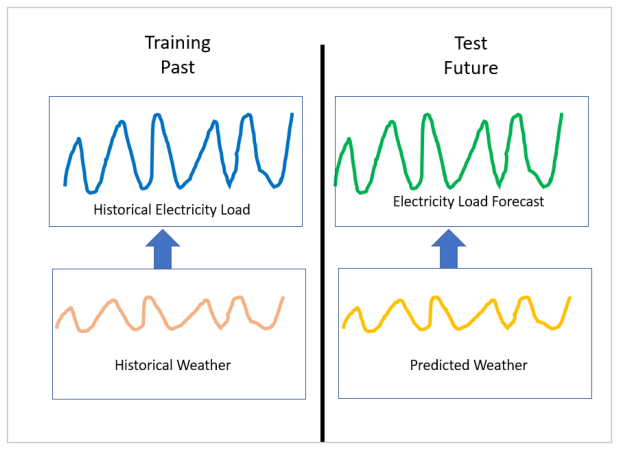

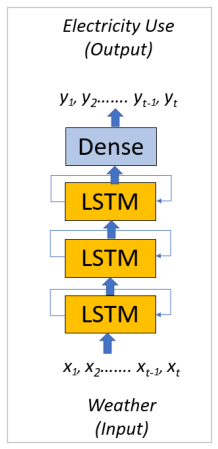

In [ ]:
show_image('LSTM_Electricity_Load_Forecast/wids1.PNG')
show_image('LSTM_Electricity_Load_Forecast/wids2.PNG')

### Now Lets get everything to work!

Here is the main function that calls in on all the helper functions to build, train and make prediction.

In [ ]:
def main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays ):
  
   time_steps_in  = numdays*24
   time_steps_out  = numdays*24
   lag_steps = lagdays*24

   df, df_weather_region_forecast=create_data_frame_for_ml(region, df_weather_history,df_weather_forecast,df_hr_load)
   plot_timeseries(df['Hour_Ending'],df['tempF'],df[region],region)
   train_df = filter_training_data(df,str_to_dt(start_training_day,0,0), str_to_dt(stop_training_day,0,0))
   train_X1,train_X2, scaler_use_el,scaler_weather=transform_data(train_df, region)
   X_train,Y_train = create_dataset(train_X2, train_X1,time_steps_in, time_steps_out,lag_steps)
   print('Training data shape (after transformtion): '+str(X_train.shape) +str(Y_train.shape))
   model = train_model(X_train,Y_train)
   df_ts_test = create_datestamp_df(prediction_start_date, prediction_end_date)
   df_test,predicted_use = forecast(model,df_ts_test,df_weather_region_forecast,region,scaler_use_el,scaler_weather)
   plot_timeseries(df_test['Hours'],df_test['tempF'],predicted_use,region)
   return df_test, predicted_use 

### Train model for Coast region. Scroll down to see logs and plots.

Complete...created and merged data sets for weather region Coast


The number of data entries match hourly requirement
Complete... filtered data according to the start and end days
 Train data shape (before transformtion) for load and temperature: (57768, 1)(57768, 1)
Complete... transformation and scaling of traing data
Training data shape (after transformtion): (342, 168, 1)(342, 168, 1)
Training LSTM Model...
Restoring model weights from the end of the best epoch.
Epoch 00021: early stopping
Complete... Training the Model
Plotting loss over epochs...


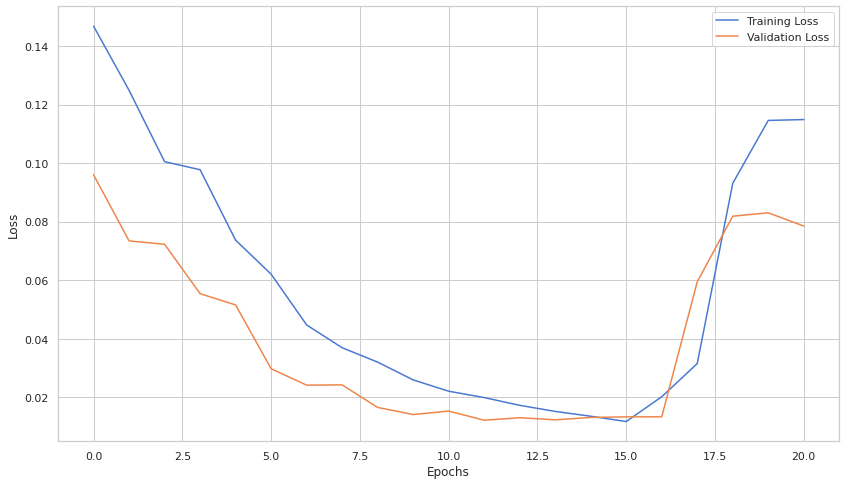

Complete ... making predictions


In [ ]:
region = 'Coast'
start_training_day =  '11-02-2014'  #starting on a sunday
stop_training_day =  '06-05-2021'
prediction_start_date = '2021-06-13'  #starting on a sunday
prediction_end_date = '2021-06-20'
numdays = 7
lagdays = 7                          # for Far West we cannot do the lagging to 7 days due to non-stationarity of usage data

df_test, predicted_use = main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays )

## only keep this for the first run
df_to_submission=df_test['Hours'].apply(lambda x:str(x)+'-05:00'  )
df_to_submission = pd.DataFrame(df_to_submission).rename(columns={"Hours": "Hour_Ending"})
## comment out the above two lines for susequent region runs

df_to_submission[region] =predicted_use 

### Train model for East region. Scroll down to see logs and plots.

In [ ]:
region = 'East'
start_training_day =  '11-02-2014'  #starting on a sunday
stop_training_day =  '06-05-2021'
prediction_start_date = '2021-06-13'  #starting on a sunday
prediction_end_date = '2021-06-20'
numdays = 7
lagdays = 7                          # for Far West we cannot do the lagging to 7 days due to non-stationarity of usage data

df_test, predicted_use = main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays )


df_to_submission[region] =predicted_use 

In [ ]:
region = 'Far West'
start_training_day =  '05-02-2019'  #starting on a sunday
stop_training_day =  '06-05-2021'
prediction_start_date = '2021-06-13'  #starting on a sunday
prediction_end_date = '2021-06-20'
numdays = 7
lagdays = 2                          # for Far West we cannot do the lagging to 7 days due to non-stationarity of usage data

df_test, predicted_use = main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays )


df_to_submission[region] =predicted_use 

In [ ]:
region = 'North'
start_training_day =  '11-02-2014'  #starting on a sunday
stop_training_day =  '06-05-2021'
prediction_start_date = '2021-06-13'  #starting on a sunday
prediction_end_date = '2021-06-20'
numdays = 7
lagdays = 7                          # for Far West we cannot do the lagging to 7 days due to non-stationarity of usage data

df_test, predicted_use = main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays )


df_to_submission[region] =predicted_use 

In [ ]:
region = 'North Central'
start_training_day =  '06-03-2018'  #starting on a sunday
stop_training_day =  '06-05-2021'
prediction_start_date = '2021-06-13'  #starting on a sunday
prediction_end_date = '2021-06-20'
numdays = 7
lagdays = 7                          # for Far West we cannot do the lagging to 7 days due to non-stationarity of usage data

df_test, predicted_use = main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays )


df_to_submission[region] =predicted_use 

In [ ]:
region = 'South'
start_training_day =  '11-02-2014'  #starting on a sunday
stop_training_day =  '06-05-2021'
prediction_start_date = '2021-06-13'  #starting on a sunday
prediction_end_date = '2021-06-20'
numdays = 7
lagdays = 7                          # for Far West we cannot do the lagging to 7 days due to non-stationarity of usage data

df_test, predicted_use = main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays )


df_to_submission[region] =predicted_use 

In [ ]:
region = 'South Central'
start_training_day =  '11-02-2014'  #starting on a sunday
stop_training_day =  '06-05-2021'
prediction_start_date = '2021-06-13'  #starting on a sunday
prediction_end_date = '2021-06-20'
numdays = 7
lagdays = 7                          # for Far West we cannot do the lagging to 7 days due to non-stationarity of usage data

df_test, predicted_use = main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays )


df_to_submission[region] =predicted_use 

In [ ]:
region = 'West'
start_training_day =  '11-02-2014'  #starting on a sunday
stop_training_day =  '06-05-2021'
prediction_start_date = '2021-06-13'  #starting on a sunday
prediction_end_date = '2021-06-20'
numdays = 7
lagdays = 7                          # for Far West we cannot do the lagging to 7 days due to non-stationarity of usage data

df_test, predicted_use = main(region,start_training_day,stop_training_day,prediction_start_date,prediction_end_date,numdays,lagdays )


df_to_submission[region] =predicted_use 

In [ ]:
df_to_submission.to_csv('submission.csv',index=False)